## 导入相关的库

In [2]:
# 基础数据处理和可视化
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# 机器学习相关
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.datasets import fetch_california_housing

# 深度学习相关
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout

# XGBoost相关
import xgboost as xgb

# 超参数优化
import optuna
from optuna.samplers import TPESampler

# 其他工具
from datetime import datetime, timedelta
import os
import joblib

# 自定义模块
from plot import *
from process_read import *
from calculate import *

def pearson_correlation_coefficient(y_true, y_pred):
    """计算皮尔逊相关系数"""
    # 使用 numpy 的 corrcoef 函数
    return np.corrcoef(y_true, y_pred)[0, 1]

## 读取数据

### 读取预测气象数据

In [6]:
result = collect_filename(r'E:\USTC_New_Past\USTC_Now_Predict','SP32_33.93N-116.69E_')

file_paths = result
print(file_paths)

dfs = [pd.read_csv(file, header=0,names=['time','predicted_radiation','predicted_direction','predicted_speed','predicted_temperature','predicted_humidity',
        'predicted_pressure']) for file in file_paths]

# 初始化一个空的 DataFrame 来存储第1天的数据
first_day_data = pd.DataFrame()

# 遍历每个 DataFrame 并筛选第1天的数据
for df in dfs:
    # 将 'time' 列转换为 datetime 类型
    df['time'] = pd.to_datetime(df['time'])

    # 找到最小的时间点作为第一天的开始
    min_time = df['time'].min()

    first_day_start = min_time
    first_day_end  = first_day_start + timedelta(days=1)

    first_day_df =  df[(df['time'] >= first_day_start) & (df['time'] < first_day_end)]
    first_day_data = pd.concat([first_day_data, first_day_df], ignore_index=True)

# first_day_data["value_now"] = pd.to_numeric(first_day_data["value_now"], errors="coerce")  # 将非数值转为NaN
first_day_data['time'] = pd.to_datetime((first_day_data['time']), errors='coerce')


['E:\\USTC_New_Past\\USTC_Now_Predict\\20230901\\SP32_33.93N-116.69E_2023-09-02to2023-09-04.txt', 'E:\\USTC_New_Past\\USTC_Now_Predict\\20230902\\SP32_33.93N-116.69E_2023-09-03to2023-09-05.txt', 'E:\\USTC_New_Past\\USTC_Now_Predict\\20230903\\SP32_33.93N-116.69E_2023-09-04to2023-09-06.txt', 'E:\\USTC_New_Past\\USTC_Now_Predict\\20230904\\SP32_33.93N-116.69E_2023-09-05to2023-09-07.txt', 'E:\\USTC_New_Past\\USTC_Now_Predict\\20230905\\SP32_33.93N-116.69E_2023-09-06to2023-09-08.txt', 'E:\\USTC_New_Past\\USTC_Now_Predict\\20230906\\SP32_33.93N-116.69E_2023-09-07to2023-09-09.txt', 'E:\\USTC_New_Past\\USTC_Now_Predict\\20230907\\SP32_33.93N-116.69E_2023-09-08to2023-09-10.txt', 'E:\\USTC_New_Past\\USTC_Now_Predict\\20230908\\SP32_33.93N-116.69E_2023-09-09to2023-09-11.txt', 'E:\\USTC_New_Past\\USTC_Now_Predict\\20230909\\SP32_33.93N-116.69E_2023-09-10to2023-09-12.txt', 'E:\\USTC_New_Past\\USTC_Now_Predict\\20230910\\SP32_33.93N-116.69E_2023-09-11to2023-09-13.txt', 'E:\\USTC_New_Past\\USTC_Now_

### 读取实测功率数据

In [7]:
file_path = r'E:/USTC_SP_Power/actual_value/安徽.永瑞光伏发电功率实测值.txt'

# 读取数据（假设数据分隔符为空格）
df = pd.read_csv(
    file_path,
    header=0,
    low_memory=False,
    names=["time", "power"]  # 直接指定列名
)
df['time'] = pd.to_datetime((df['time']), errors='coerce')
df.set_index('time', inplace=True)

#按15分钟重采样
mask = (df.index.minute%15 ==0) & (df.index.second == 0)
df = df.loc[mask]



### 读取辐射实测数据

In [8]:
import pandas as pd
import matplotlib.pyplot as plt
# from pygments.lexer import default

# 读取科大站点实测数据
plt.rcParams['axes.facecolor'] = 'white'
plt.rcParams['font.sans-serif'] = ['Microsoft YaHei']

file_path = r'E:/USTC_SP_Power/actual_value/安徽.永瑞光伏气象数据实测值.txt'

# 读取数据（假设数据分隔符为空格）
df_yr = pd.read_csv(
    file_path,
    header=0,
    low_memory=False,
    usecols=[0,6],
    names = ['time','r_sw_in']# 直接指定列名
)
df_yr['time'] = pd.to_datetime((df_yr['time']), errors='coerce')
# df.set_index('time', inplace=True)

#按15分钟重采样
df_yr



,time,r_sw_in
0,2023-09-01 00:00:00,0.0
1,2023-09-01 00:05:00,0.0
2,2023-09-01 00:10:00,0.0
3,2023-09-01 00:15:00,0.0
4,2023-09-01 00:20:00,0.0
...,...,...
120664,2024-11-01 23:40:00,0.0
120665,2024-11-01 23:45:00,0.0
120666,2024-11-01 23:50:00,0.0
120667,2024-11-01 23:55:00,0.0


## 读取永瑞预测功率数据

In [10]:
import pandas as pd
import matplotlib.pyplot as plt
# from pygments.lexer import default

# 读取科大站点实测数据
plt.rcParams['axes.facecolor'] = 'white'
plt.rcParams['font.sans-serif'] = ['Microsoft YaHei']

file_path = r'E:\Power_Pre_Model\actual_value\安徽.永瑞光伏短期功率预测.txt'

# 读取数据（假设数据分隔符为空格）
df_pre_yr = pd.read_csv(
    file_path,
    header=0,
    low_memory=False,
    usecols=[1,2],
    names=["time", "power_yr"]  # 直接指定列名
)
# 转换时间列并删除重复时间值
df_pre_yr['time'] = pd.to_datetime(df_pre_yr['time'], errors='coerce')
df_pre_yr = df_pre_yr.drop_duplicates(subset=['time'], keep='first')
df_pre_yr.set_index('time', inplace=True)


#按15分钟重采样
mask = (df_pre_yr.index.minute%15 ==0) & (df_pre_yr.index.second == 0)
df_pre_yr = df_pre_yr.loc[mask]
df_pre_yr


,power_yr
time,
2023-09-02 00:15:00,0.0
2023-09-02 00:30:00,0.0
2023-09-02 00:45:00,0.0
2023-09-02 01:00:00,0.0
2023-09-02 01:15:00,0.0
...,...
2024-11-01 23:00:00,0.0
2024-11-01 23:15:00,0.0
2024-11-01 23:30:00,0.0


In [11]:
merged_df = df.merge(first_day_data, on='time', how='inner')
merged_df = merged_df.merge(df_yr, on='time', how='inner')
merged_df = merged_df.merge(df_pre_yr, on='time', how='inner')
merged_df['year_month'] = merged_df['time'].dt.to_period('M')
# 添加月份列
merged_df['month'] = merged_df['time'].dt.month
# 添加Time_code列(将时间转换为当天的分钟数)
merged_df['Time_code'] = merged_df['time'].dt.hour * 60 + merged_df['time'].dt.minute

# 过滤掉2024年5月的数据
merged_df = merged_df[~((merged_df['time'].dt.year == 2024) & (merged_df['time'].dt.month == 5))]

# 按年月分组
year_month_groups = merged_df.groupby('year_month')

# 遍历每组年月的数据
for year_month, monthly_data in year_month_groups:
    print(f"Year-Month: {year_month}")
    print(monthly_data)
print("\n")

train_sets = []
test_sets = []
for month, group in year_month_groups:
    last_ten_days = group.iloc[-960:].dropna()
    test_sets.append(last_ten_days)
    train_sets.append(group.iloc[:-960].dropna())

# 合并当前文件的所有月的最后五天数据
test_sets_A = pd.concat(test_sets)
train_sets_A= pd.concat(train_sets)
train_sets_A

Year-Month: 2023-09
                    time  power  predicted_radiation  predicted_direction  \
0    2023-09-02 00:15:00    0.0                  0.0            177.26001   
1    2023-09-02 00:30:00    0.0                  0.0            177.28870   
2    2023-09-02 00:45:00    0.0                  0.0            175.47620   
3    2023-09-02 01:00:00    0.0                  0.0            173.07214   
4    2023-09-02 01:15:00    0.0                  0.0            166.50360   
...                  ...    ...                  ...                  ...   
2229 2023-09-30 22:45:00    0.0                  0.0            243.09692   
2230 2023-09-30 23:00:00    0.0                  0.0            239.02165   
2231 2023-09-30 23:15:00    0.0                  0.0            237.57990   
2232 2023-09-30 23:30:00    0.0                  0.0            240.37784   
2233 2023-09-30 23:45:00    0.0                  0.0            243.43903   

      predicted_speed  predicted_temperature  predicted

,time,power,predicted_radiation,predicted_direction,predicted_speed,predicted_temperature,predicted_humidity,predicted_pressure,r_sw_in,power_yr,year_month,month,Time_code
0,2023-09-02 00:15:00,0.0,0.0,177.26001,2.122803,22.240845,87.685486,1007.80420,0.0,0.0,2023-09,9,15
1,2023-09-02 00:30:00,0.0,0.0,177.28870,1.667999,21.789550,90.217160,1007.70260,0.0,0.0,2023-09,9,30
2,2023-09-02 00:45:00,0.0,0.0,175.47620,1.448032,21.531494,91.582590,1007.64770,0.0,0.0,2023-09,9,45
3,2023-09-02 01:00:00,0.0,0.0,173.07214,1.274875,21.235779,93.002580,1007.57900,0.0,0.0,2023-09,9,60
4,2023-09-02 01:15:00,0.0,0.0,166.50360,1.254738,21.050476,93.449610,1007.47360,0.0,0.0,2023-09,9,75
...,...,...,...,...,...,...,...,...,...,...,...,...,...
38443,2024-10-21 22:45:00,0.0,0.0,278.96155,1.446351,12.593567,80.711210,1018.08594,0.0,0.0,2024-10,10,1365
38444,2024-10-21 23:00:00,0.0,0.0,286.13962,1.503384,12.546448,81.246720,1018.04420,0.0,0.0,2024-10,10,1380
38445,2024-10-21 23:15:00,0.0,0.0,284.63843,1.584258,12.473755,82.035410,1017.95190,0.0,0.0,2024-10,10,1395
38446,2024-10-21 23:30:00,0.0,0.0,286.51410,1.633505,12.463287,82.283480,1017.91766,0.0,0.0,2024-10,10,1410


In [12]:
merged_df.columns

Index(['time', 'power', 'predicted_radiation', 'predicted_direction',
       'predicted_speed', 'predicted_temperature', 'predicted_humidity',
       'predicted_pressure', 'r_sw_in', 'power_yr', 'year_month', 'month',
       'Time_code'],
      dtype='object')

In [13]:
group

,time,power,predicted_radiation,predicted_direction,predicted_speed,predicted_temperature,predicted_humidity,predicted_pressure,r_sw_in,power_yr,year_month,month,Time_code
39408,2024-11-01 00:00:00,0.0,0.0,232.21725,3.526040,13.503143,74.984390,1016.71120,0.0,0.0,2024-11,11,0
39409,2024-11-01 00:15:00,0.0,0.0,233.38672,3.380191,13.199310,76.762405,1016.83594,0.0,0.0,2024-11,11,15
39410,2024-11-01 00:30:00,0.0,0.0,234.33618,3.330687,12.951141,78.297350,1016.95570,0.0,0.0,2024-11,11,30
39411,2024-11-01 00:45:00,0.0,0.0,235.25410,3.351776,12.756866,79.605090,1017.03156,0.0,0.0,2024-11,11,45
39412,2024-11-01 01:00:00,0.0,0.0,237.12206,3.386090,12.583008,80.852800,1017.06866,0.0,0.0,2024-11,11,60
...,...,...,...,...,...,...,...,...,...,...,...,...,...
39500,2024-11-01 23:00:00,0.0,0.0,240.72913,2.941433,12.906342,64.612045,1018.00366,0.0,0.0,2024-11,11,1380
39501,2024-11-01 23:15:00,0.0,0.0,245.79382,2.898940,12.728027,65.445490,1018.03550,0.0,0.0,2024-11,11,1395
39502,2024-11-01 23:30:00,0.0,0.0,249.33261,2.885100,12.531708,66.383705,1018.06006,0.0,0.0,2024-11,11,1410
39503,2024-11-01 23:45:00,0.0,0.0,251.44669,2.885829,12.315277,67.445694,1018.08563,0.0,0.0,2024-11,11,1425


In [14]:
# 选择特征列
features = ['Time_code','predicted_radiation','predicted_direction','predicted_speed','predicted_temperature','predicted_humidity',
           'predicted_pressure','month']
target = ['power']
X = merged_df[features]
y = merged_df[target]


## 划分训练集和测试集

In [21]:
# 每个月前24天的数据作为训练集，后面的数据作为测试集
train_mask = merged_df['time'].dt.day <= 24

X_train = X[train_mask]
# X_train_2 = train_sets_A
y_train = y[train_mask]
X_test = X[~train_mask] 
y_test = y[~train_mask] 

In [22]:
X_train_2 = train_sets_A.loc[:,['Time_code','predicted_radiation','predicted_direction','predicted_speed','predicted_temperature','predicted_humidity',
           'predicted_pressure','month']]
y_train_2 = train_sets_A.loc[:, ['power']]
X_test_2 = test_sets_A.loc[:,['Time_code','predicted_radiation','predicted_direction','predicted_speed','predicted_temperature','predicted_humidity',
           'predicted_pressure','month']]
y_test_2 = test_sets_A.loc[:, ['power']]



In [23]:
X_train_2.columns


Index(['Time_code', 'predicted_radiation', 'predicted_direction',
       'predicted_speed', 'predicted_temperature', 'predicted_humidity',
       'predicted_pressure', 'month'],
      dtype='object')

In [24]:
X_test_2.columns


Index(['Time_code', 'predicted_radiation', 'predicted_direction',
       'predicted_speed', 'predicted_temperature', 'predicted_humidity',
       'predicted_pressure', 'month'],
      dtype='object')

In [25]:
print(X_train_2.shape)
print(X_test_2.shape)

(24063, 8)
(12577, 8)


In [26]:
y_train_2.columns

Index(['power'], dtype='object')

## 贝叶斯优化

In [50]:
# 定义目标函数
def objective(trial):
        # 定义要调优的超参数空间
        param = {
                'objective': 'reg:squarederror',
                'tree_method': 'hist',  # 使用直方图加速
                'eval_metric': 'rmse',
                'random_state': 42,
                'n_estimators': trial.suggest_int('n_estimators', 50, 500),
                'max_depth': trial.suggest_int('max_depth', 3, 10),
                'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3, log=True),
                'subsample': trial.suggest_float('subsample', 0.6, 1.0),
                'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0),
                'gamma': trial.suggest_float('gamma', 0, 0.5),
                'reg_alpha': trial.suggest_float('reg_alpha', 0, 1.0),
                'reg_lambda': trial.suggest_float('reg_lambda', 0, 1.0),
                'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        }

        # 创建XGBoost模型
        model = xgb.XGBRegressor(**param)

        # 交叉验证
        from sklearn.model_selection import cross_val_score
        rmse = cross_val_score(model, X_train, y_train, cv=5, scoring='neg_root_mean_squared_error').mean()

        return -rmse  # 由于 cross_val_score 使用负的指标，返回时取反

# 创建Optuna的研究对象
study = optuna.create_study(direction='minimize', sampler=TPESampler(seed=42))
study.optimize(objective, n_trials=100)

# 输出最佳参数和最佳得分
print("贝叶斯优化找到的最佳参数：")
for key, value in study.best_params.items():
        print(f"    {key}: {value}")
print("贝叶斯优化最佳得分（RMSE）：", study.best_value)

[I 2025-04-24 16:41:42,646] A new study created in memory with name: no-name-92326623-5eb5-4d83-af88-6f36867512a0
[I 2025-04-24 16:41:44,771] Trial 0 finished with value: 12.610778427124023 and parameters: {'n_estimators': 218, 'max_depth': 10, 'learning_rate': 0.1205712628744377, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'gamma': 0.07799726016810132, 'reg_alpha': 0.05808361216819946, 'reg_lambda': 0.8661761457749352, 'min_child_weight': 7}. Best is trial 0 with value: 12.610778427124023.
[I 2025-04-24 16:41:45,502] Trial 1 finished with value: 14.66787109375 and parameters: {'n_estimators': 369, 'max_depth': 3, 'learning_rate': 0.2708160864249968, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'gamma': 0.09091248360355031, 'reg_alpha': 0.18340450985343382, 'reg_lambda': 0.3042422429595377, 'min_child_weight': 6}. Best is trial 0 with value: 12.610778427124023.
[I 2025-04-24 16:41:46,257] Trial 2 finished with value: 12.636738014

贝叶斯优化找到的最佳参数：
    n_estimators: 172
    max_depth: 6
    learning_rate: 0.018009052352685986
    subsample: 0.7114259124200157
    colsample_bytree: 0.7233944529587351
    gamma: 0.0007733200261710038
    reg_alpha: 0.18828531254690836
    reg_lambda: 0.5704060739557253
    min_child_weight: 4
贝叶斯优化最佳得分（RMSE）： 12.102823638916016


In [51]:
import json
# 保存最优参数
best_params = study.best_params
# 将最优参数保存为json文件
with open('xg_params_2.json', 'w', encoding='utf-8') as f:
    json.dump(best_params, f, ensure_ascii=False, indent=4)
print("最优参数已保存到xg_params_2.json文件中")

最优参数已保存到xg_params_2.json文件中


In [28]:
# 使用最佳参数训练模型
best_params = {
    "n_estimators": 172,
    "max_depth": 6,
    "learning_rate": 0.018009052352685986,
    "subsample": 0.7114259124200157,
    "colsample_bytree": 0.7233944529587351,
    "gamma": 0.0007733200261710038,
    "reg_alpha": 0.18828531254690836,
    "reg_lambda": 0.5704060739557253,
    "min_child_weight": 4
}
best_params['objective'] = 'reg:squarederror'
best_params['random_state'] = 42
model = xgb.XGBRegressor(**best_params)
model.fit(X_train_2, y_train_2)
import joblib
os.makedirs(r'e:\Power_Pre_Model\models', exist_ok=True)
joblib.dump(model, fr'e:\Power_Pre_Model\models\xgboost3.pkl')
print(f"模型已保存为 xgboost3.pkl")
# 在测试集上评估模型
y_pred_2 = model.predict(X_test_2)
mse = mean_squared_error(y_test_2, y_pred_2)
rmse = np.sqrt(mean_squared_error(y_test_2, y_pred_2))
print("测试集均方误差（MSE）：", mse)
print("测试集根均方误差（RMSE）：", rmse)

模型已保存为 xgboost3.pkl
测试集均方误差（MSE）： 94.45816040039062
测试集根均方误差（RMSE）： 9.718958812567868


## 评估模型

In [28]:
# 在测试集上评估模型
y_pred = model.predict(X_test_2)

# 计算多种评估指标
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, explained_variance_score
import numpy as np
import pandas as pd
# 计算所有评估指标
mse = mean_squared_error(y_test_2, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test_2, y_pred)
r2 = r2_score(y_test_2, y_pred)
evs = explained_variance_score(y_test_2, y_pred)

# 计算归一化指标
y_mean = np.mean(np.abs(y_test_2))
nmae = mae / y_mean
nmae_percentage = nmae * 100

y_range = np.max(y_test_2) - np.min(y_test_2)
nrmse_range = rmse / y_range
nrmse_mean = rmse / np.mean(y_test_2)
nrmse_percentage = nrmse_mean * 100

# 创建评估指标字典
metrics_dict = {
    '评估指标': [
        'MSE (均方误差)',
        'RMSE (根均方误差)',
        'MAE (平均绝对误差)',
        'R² (决定系数)',
        '解释方差分数',
        'NMAE (归一化平均绝对误差)',
        'NMAE百分比',
        'NRMSE (按范围归一化)',
        'NRMSE (按平均值归一化)',
        'NRMSE百分比'
    ],
    '数值': [
        mse,
        rmse,
        mae,
        r2,
        evs,
        nmae,
        nmae_percentage,
        nrmse_range,
        nrmse_mean,
        nrmse_percentage
    ]
}

# 创建DataFrame并保存为CSV
metrics_df = pd.DataFrame(metrics_dict)
metrics_df.to_csv('model_evaluation_metrics_xgboost_1.csv', index=False, encoding='utf-8-sig')

# 打印评估指标
print("测试集均方误差（MSE）：", mse)
print("测试集根均方误差（RMSE）：", rmse)
print("测试集平均绝对误差（MAE）：", mae)
print("测试集决定系数（R²）：", r2)
print("测试集解释方差分数：", evs)
print("测试集归一化平均绝对误差（NMAE）：", nmae)
print("测试集归一化平均绝对误差百分比：", nmae_percentage, "%")
print("测试集归一化均方根误差（NRMSE，按范围）：", nrmse_range)
print("测试集归一化均方根误差（NRMSE，按平均值）：", nrmse_mean)
print("测试集归一化均方根误差百分比：", nrmse_percentage, "%")



测试集均方误差（MSE）： 91.83137512207031
测试集根均方误差（RMSE）： 9.582868835691654
测试集平均绝对误差（MAE）： 5.059539318084717
测试集决定系数（R²）： 0.8173789978027344
测试集解释方差分数： 0.817710505930469
测试集归一化平均绝对误差（NMAE）： 0.365004314593692
测试集归一化平均绝对误差百分比： 36.500431459369196 %
测试集归一化均方根误差（NRMSE，按范围）： 0.11417332798886885
测试集归一化均方根误差（NRMSE，按平均值）： 0.6913254846563713
测试集归一化均方根误差百分比： 69.13254846563713 %


## 按月份作图

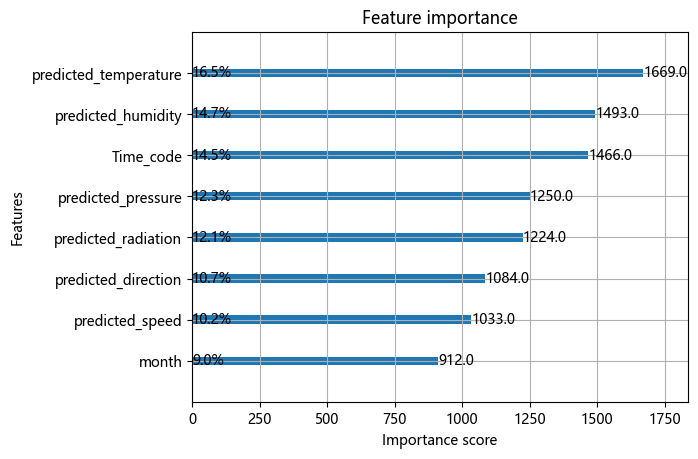

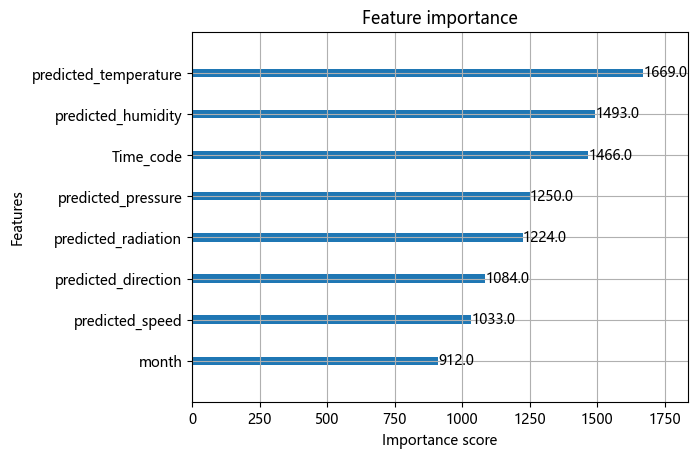

In [29]:
best_model  = model
import matplotlib.pyplot as plt
# 获取特征重要性
importance = best_model.get_booster().get_score(importance_type='weight')

# 将特征重要性转换为百分比
total_importance = sum(importance.values())
importance_percent = {k: (v / total_importance) * 100 for k, v in importance.items()}

# 绘制特征重要性图
xgb.plot_importance(best_model, importance_type='weight', max_num_features=20)

# 修改 y 轴标签为百分比
importance_percent = dict(sorted(importance_percent.items(), key=lambda item: item[1]))
ax = plt.gca()
for c, v in enumerate(importance_percent.values()):
        ax.text(0, c, f"{v:.1f}%", va='center')

plt.show()
# 绘制特征重要性图
xgb.plot_importance(best_model, importance_type='weight', max_num_features=20)
plt.show()

## 对比xg和站点

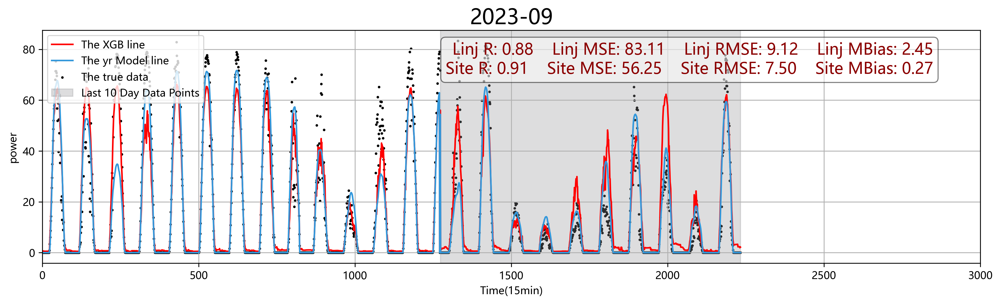

均方误差 (MSE)= 16959.84433405623
均方根误差 (RMSE)= 130.22996711224428
R= 0.829801419264537
MBias= 1.3032871759062516


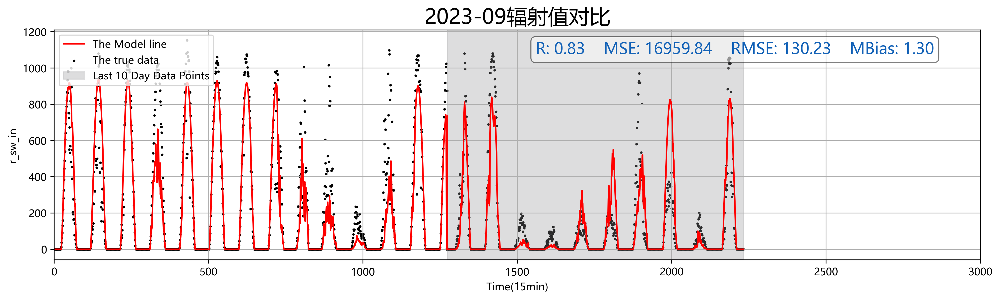

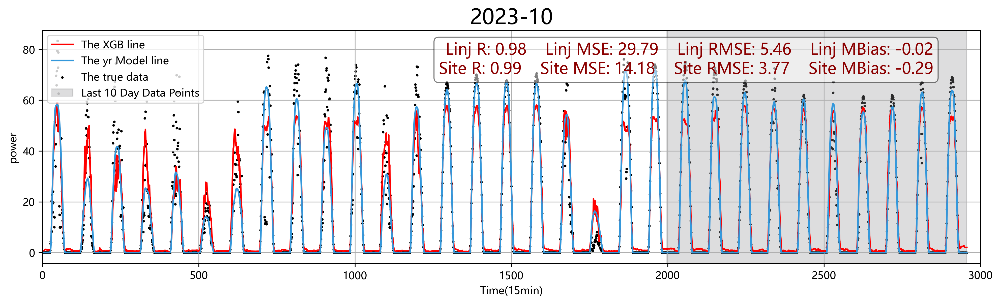

均方误差 (MSE)= 8458.981939770589
均方根误差 (RMSE)= 91.97272389013271
R= 0.9648940413591179
MBias= -20.968129121385413


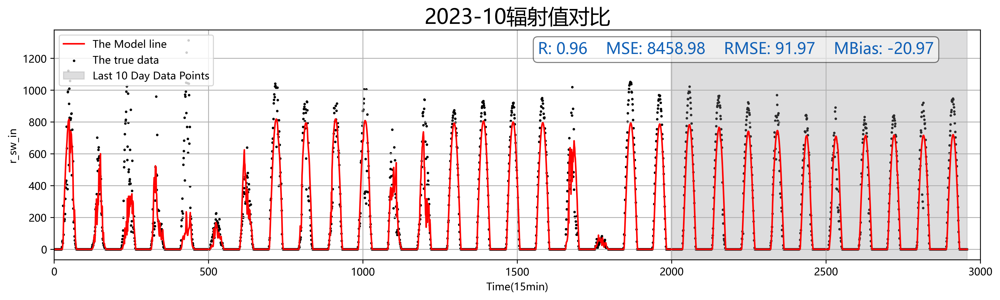

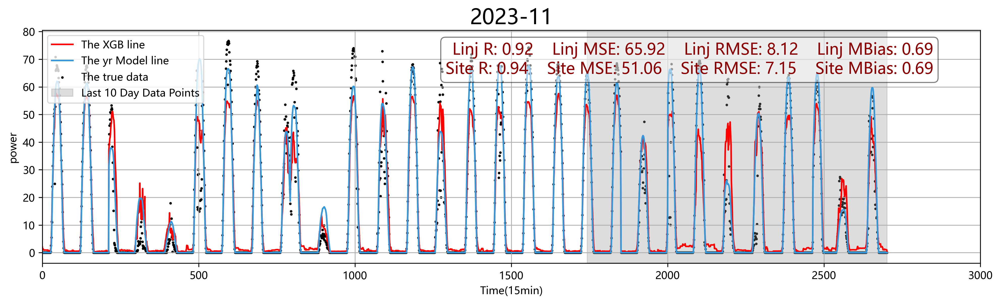

均方误差 (MSE)= 16411.254874887654
均方根误差 (RMSE)= 128.10642011580705
R= 0.9179862340982016
MBias= -39.03856996864583


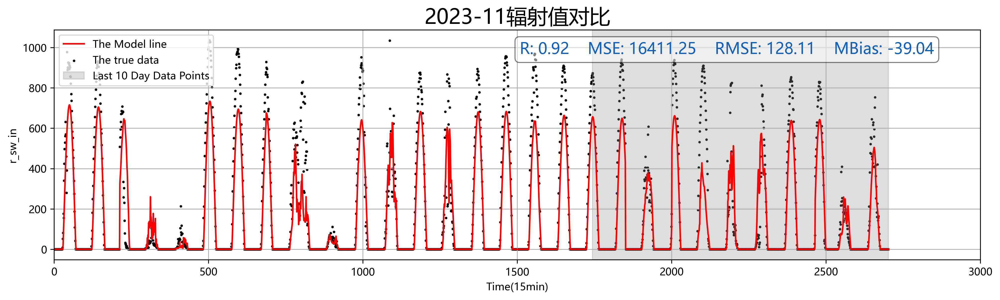

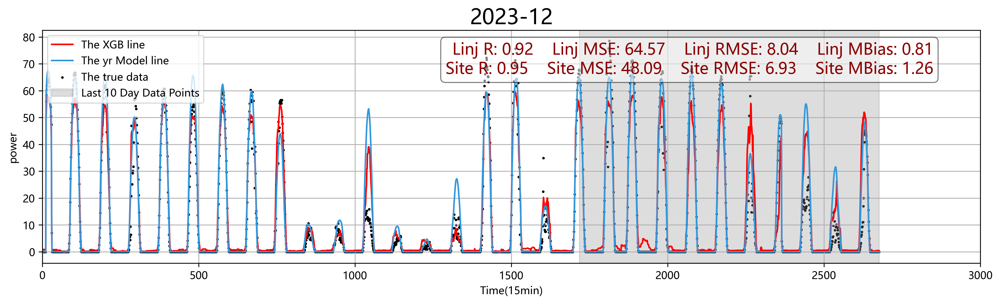

均方误差 (MSE)= 12303.036739604846
均方根误差 (RMSE)= 110.91905489862798
R= 0.9117793409390497
MBias= -13.912022114333332


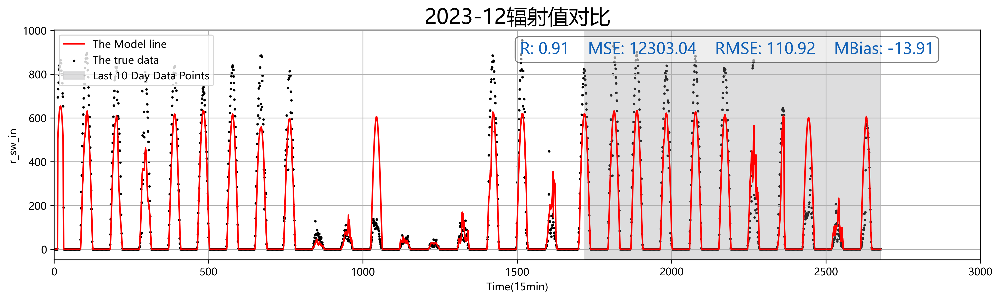

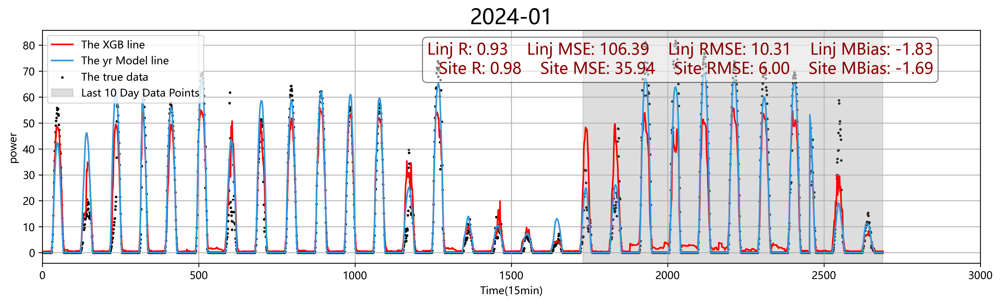

均方误差 (MSE)= 19594.52666872068
均方根误差 (RMSE)= 139.98045102342212
R= 0.8926862376565224
MBias= -35.19284647510417


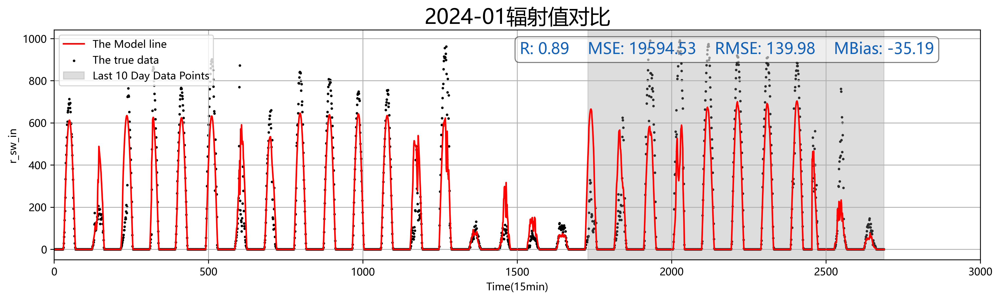

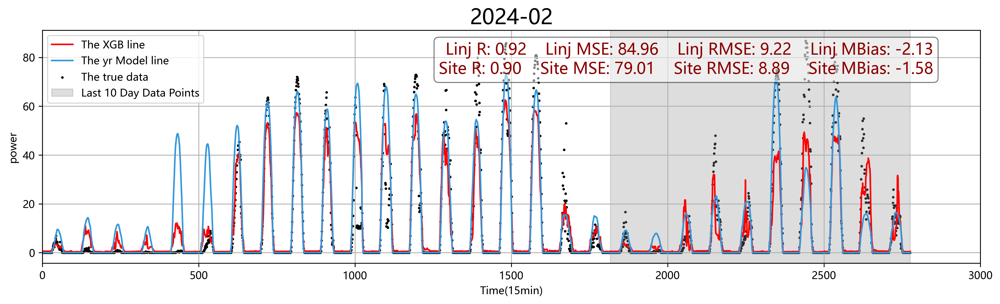

均方误差 (MSE)= 10366.437941798016
均方根误差 (RMSE)= 101.81570577174239
R= 0.9159391266450944
MBias= -9.114078893812502


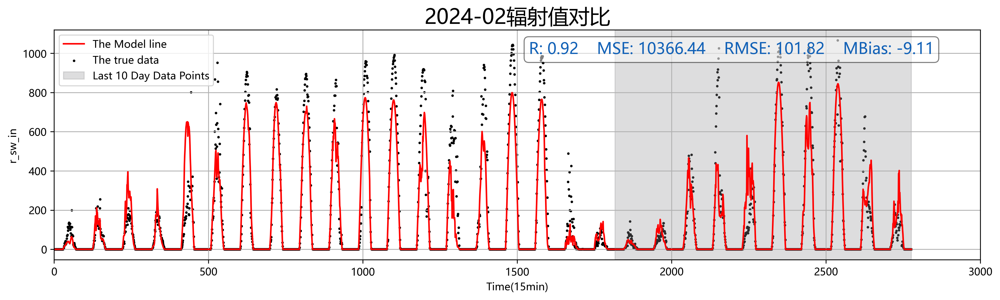

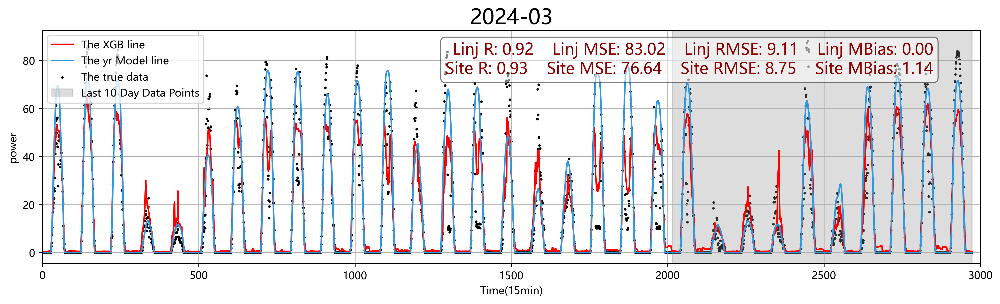

均方误差 (MSE)= 13010.573921956231
均方根误差 (RMSE)= 114.06390279994908
R= 0.9235195373673954
MBias= 13.55009780452083


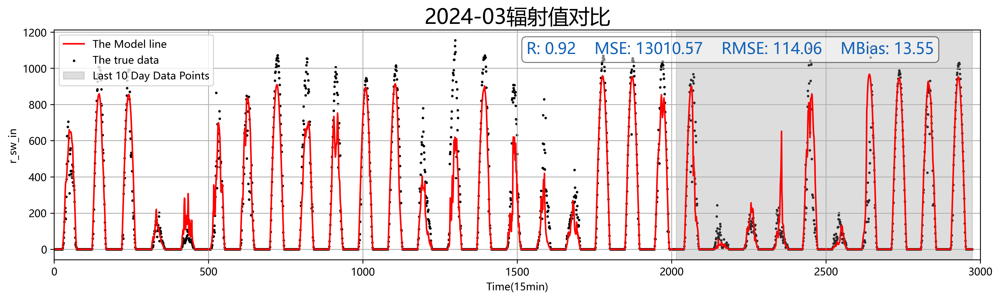

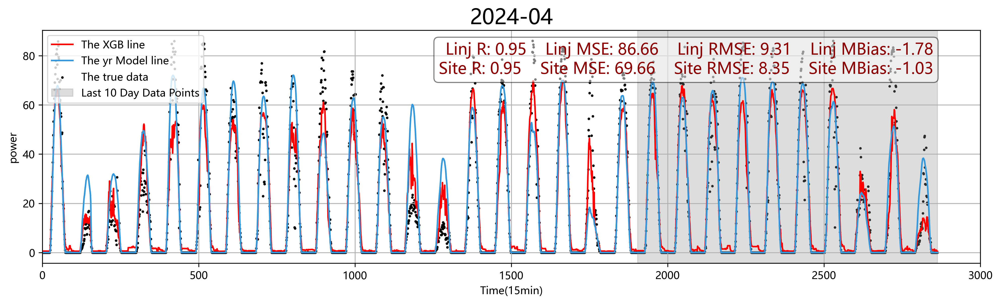

均方误差 (MSE)= 15811.826784137182
均方根误差 (RMSE)= 125.74508652085449
R= 0.9276885012576268
MBias= 7.959969514732289


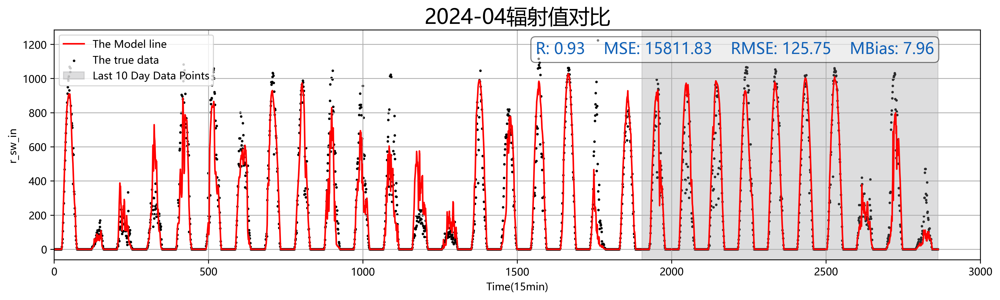

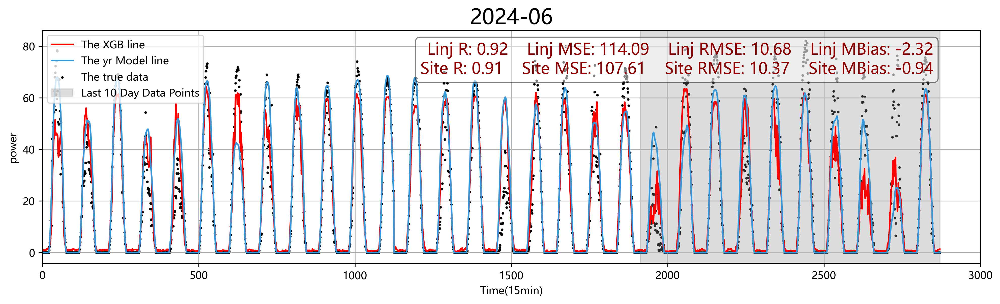

均方误差 (MSE)= 37960.387917208514
均方根误差 (RMSE)= 194.8342575555144
R= 0.8012520043094503
MBias= -0.6102616773958327


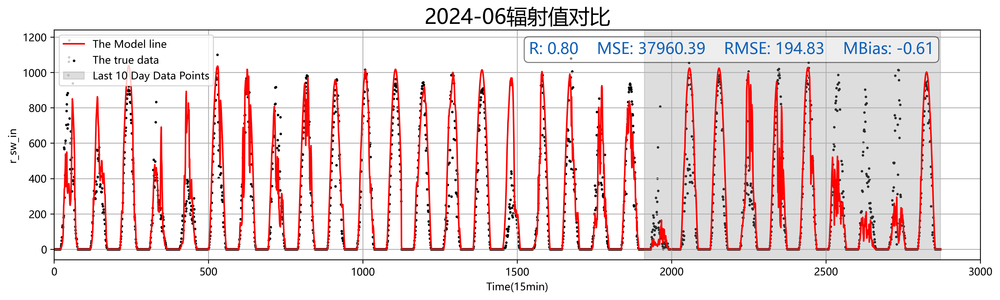

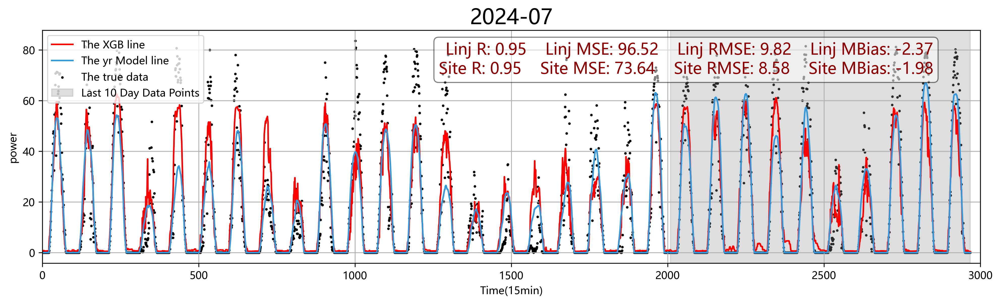

均方误差 (MSE)= 25798.581138566635
均方根误差 (RMSE)= 160.61936725864237
R= 0.8769607870150667
MBias= -20.51228294104167


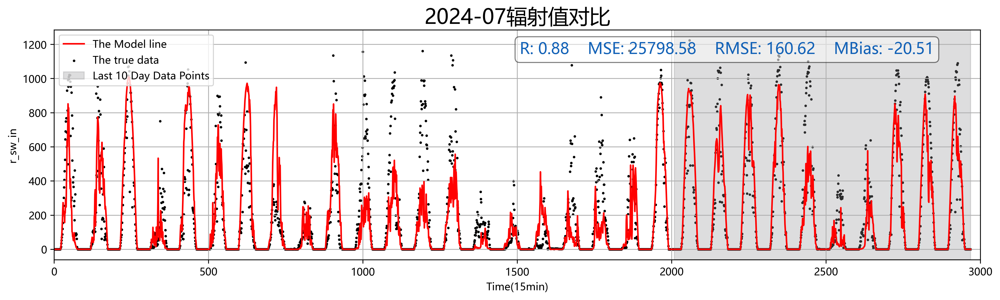

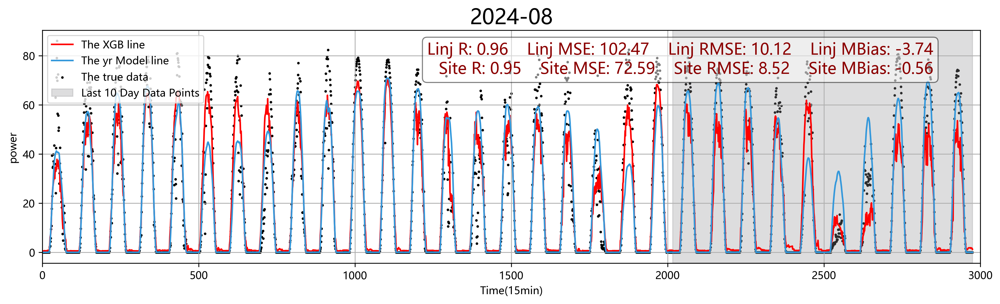

均方误差 (MSE)= 36060.783152480275
均方根误差 (RMSE)= 189.89676972629175
R= 0.8520421166361265
MBias= -71.1942355869375


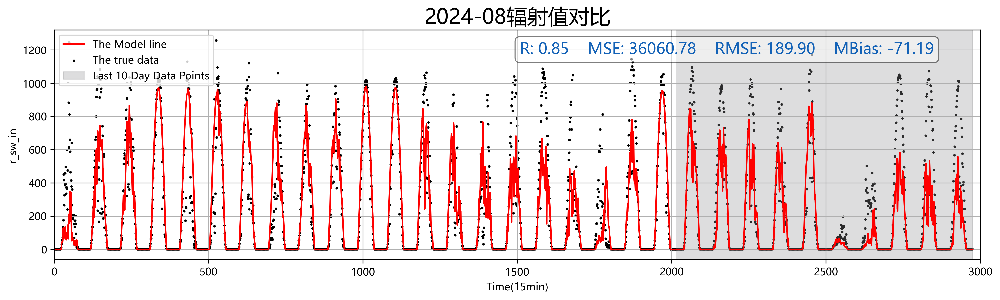

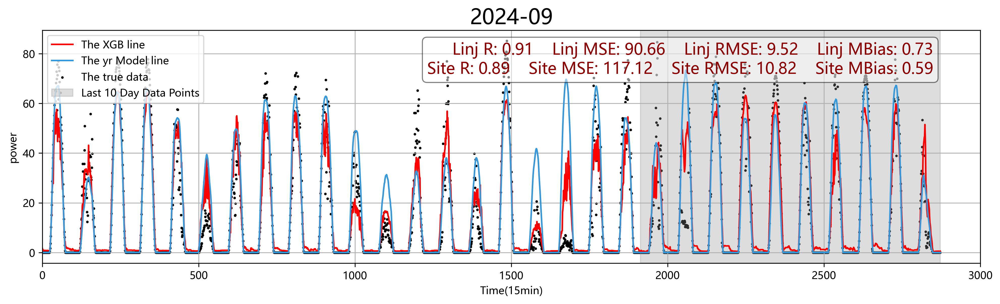

均方误差 (MSE)= 22976.062272239586
均方根误差 (RMSE)= 151.57856798452605
R= 0.9132011864570384
MBias= -39.338827567020836


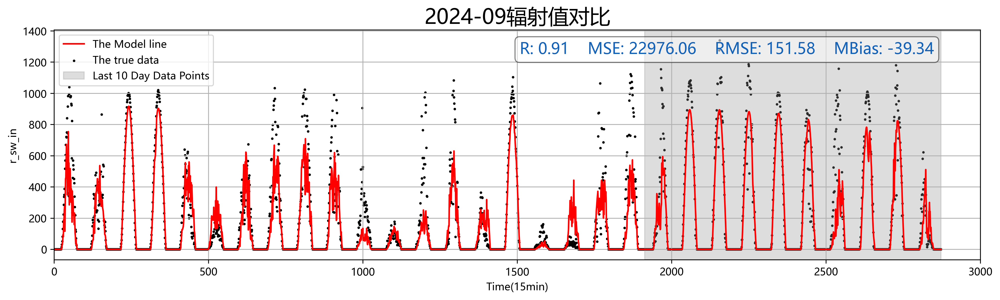

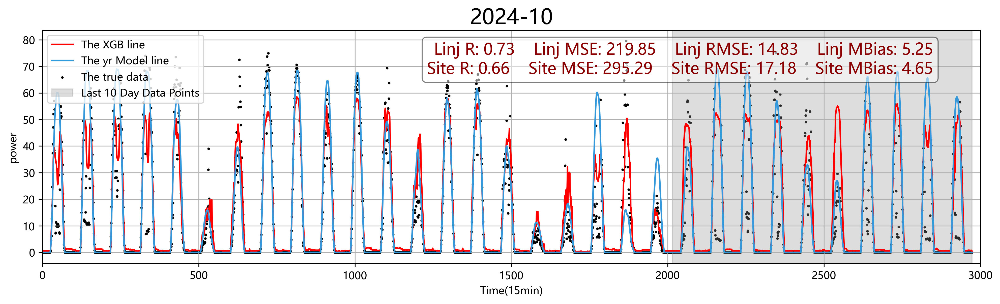

均方误差 (MSE)= 20772.043890017383
均方根误差 (RMSE)= 144.12509805726893
R= 0.8956193250522138
MBias= -16.1703484476875


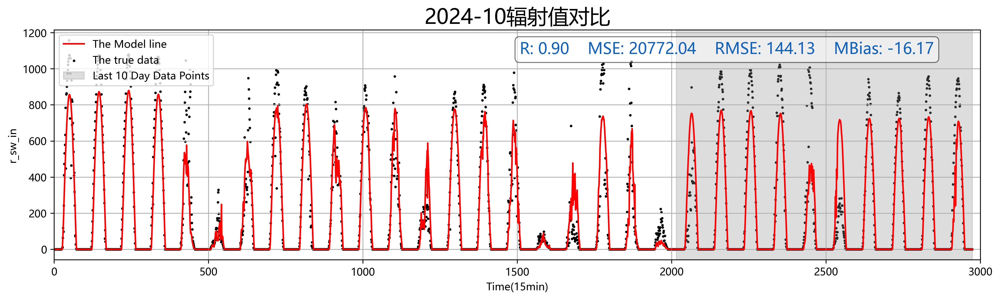

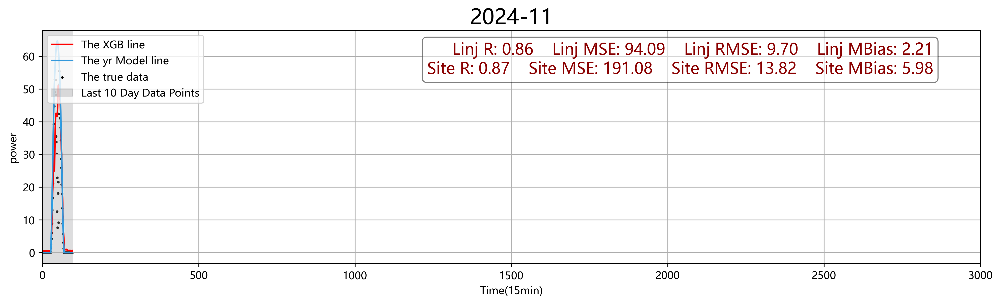

均方误差 (MSE)= 9442.894897212727
均方根误差 (RMSE)= 97.17455889898717
R= 0.9460256340715472
MBias= -16.303316917525773


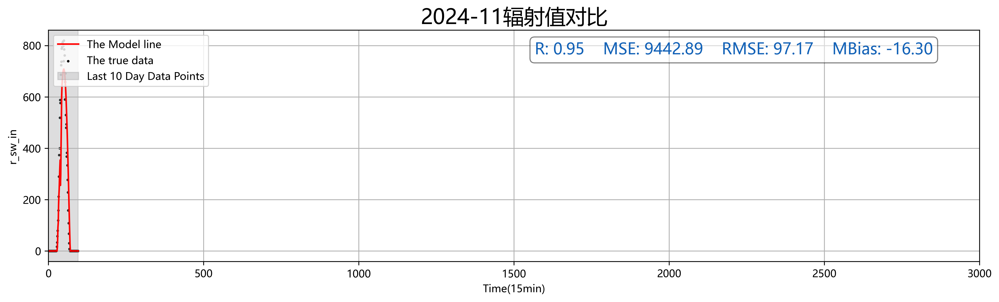

In [30]:
for month, group in year_month_groups:
                
        train_sets = []
        test_sets = []

        last_ten_days = group.iloc[-960:].dropna()
        test_sets.append(last_ten_days)
        train_sets.append(group.iloc[:-960].dropna())

        # 合并当前文件的所有月的最后五天数据
        test_sets_A1 = pd.concat(test_sets)
        train_sets_A1= pd.concat(train_sets)


        X_train1= train_sets_A1.loc[:,['Time_code','predicted_radiation','predicted_direction','predicted_speed','predicted_temperature','predicted_humidity',
                                'predicted_pressure','month']]
        
        y_train1= train_sets_A1.loc[:, 'power']

        X_test1= test_sets_A1.loc[:,['Time_code','predicted_radiation','predicted_direction','predicted_speed','predicted_temperature','predicted_humidity',
                                'predicted_pressure','month']]
        
        y_test1= test_sets_A1.loc[:, 'power']


        X_train1, y_train1, X_test1, y_test1

        r_sw_in_train = train_sets_A1.loc[:,['r_sw_in']]
        r_sw_in_test = test_sets_A1.loc[:,['r_sw_in']]

        yr_sw_train = train_sets_A1.loc[:,['power_yr']]
        yr_sw_test = test_sets_A1.loc[:,['power_yr']]

        X = pd.concat([X_train1,X_test1])
        y = pd.concat([y_train1,y_test1])
        r_sw_in = pd.concat([r_sw_in_train,r_sw_in_test]).values.flatten()
        yr_sw = pd.concat([yr_sw_train,yr_sw_test]).values.flatten()


        plt.figure(dpi=300,figsize=(16,4))
        #plt.scatter(train_data.index.tolist(),v, color='#d19a5f',marker='o',s=2.0,label='The WP4 data')  # 绘制散点

        #d_train = xgb.DMatrix(X)
        d_train = X

        plt.plot(range(len(X.index.tolist())),model.predict(d_train),color='red',label='The XGB line')  # 绘制回归线
        plt.plot(range(len(X.index.tolist())),yr_sw,color= '#3498DB',label='The yr Model line')
        plt.scatter(range(len(X.index.tolist())),y, color='black',marker='o',s=2.0,label='The true data') 

        plt.grid(True)
        plt.title(f'{str(month)}', fontsize=20)
        plt.xlabel('{}'.format('Time(15min)'))
        plt.ylabel('{}'.format('power'))
        plt.xlim(0,3000)
        # plt.ylim(0,12)

        predict =model.predict(d_train)
        # 计算各项评估指标
        mse = mean_squared_error(predict[-960:], y[-960:])
        mse_site = mean_squared_error(yr_sw[-960:], y[-960:])
        rmse = np.sqrt(mean_squared_error(predict[-960:], y[-960:]))
        rmse_site = np.sqrt(mean_squared_error(yr_sw[-960:], y[-960:]))
        r = pearson_correlation_coefficient(predict[-960:], y[-960:])
        r_site = pearson_correlation_coefficient(yr_sw[-960:], y[-960:])
        mbias = np.sum(predict[-960:] - y[-960:])/len(y[-960:])
        mbias_site = np.sum(yr_sw[-960:] - y[-960:])/len(y[-960:])

        # 创建评估指标数据字典
        metrics_data = {
            'Month': [month],
            'Linj_MSE': [mse],
            'Site_MSE': [mse_site],
            'Linj_RMSE': [rmse],
            'Site_RMSE': [rmse_site],
            'Linj_R': [r],
            'Site_R': [r_site],
            'Linj_MBias': [mbias],
            'Site_MBias': [mbias_site]
        }

        # 创建DataFrame并保存到CSV
        metrics_df = pd.DataFrame(metrics_data)
        
        # 检查文件是否存在
        csv_path = 'site_linj_compare_yr.csv'
        if os.path.exists(csv_path):
            # 如果文件存在，追加数据
            metrics_df.to_csv(csv_path, mode='a', header=False, index=False)
        else:
            # 如果文件不存在，创建新文件
            metrics_df.to_csv(csv_path, index=False)
        # 在右上角添加指标文本
        # 生成Linj模型的评估指标文本
        linj_textstr = '    '.join((f'Linj R: {r:.2f}',f'Linj MSE: {mse:.2f}',f'Linj RMSE: {rmse:.2f}',f'Linj MBias: {mbias:.2f}' ))
        # 生成site模型的评估指标文本
        site_textstr = '    '.join((f'Site R: {r_site:.2f}',f'Site MSE: {mse_site:.2f}',f'Site RMSE: {rmse_site:.2f}',f'Site MBias: {mbias_site:.2f}' ))
        # 合并两行评估指标
        textstr = linj_textstr + '\n' + site_textstr
        plt.gca().text(0.95, 0.95, textstr, transform=plt.gca().transAxes,
                        fontsize=15, verticalalignment='top', horizontalalignment='right',color='darkred',
                        bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))

        # 最后300个数据点的索引
        start_idx = len(X) - 960
        end_idx = len(X)

        # 用色块标出最后300个数据点的区域
        plt.axvspan(start_idx, end_idx-1, color='#919193', alpha=0.3, label='Last 10 Day Data Points')
        # 设置图例在左上角
        plt.legend(loc='upper left')
        # 使用从predict_rating导入的save_dir变量
        save_dir = 'xgb_fig'
        os.makedirs(save_dir, exist_ok=True)
        plt.savefig(os.path.join(save_dir, f"AI_{str(month)}.png"), dpi=300, format='png', bbox_inches='tight', pad_inches=0)
        plt.show()
        
        plt.figure(dpi=300,figsize=(16,4))

        #plt.scatter(train_data.index.tolist(),v, color='#d19a5f',marker='o',s=2.0,label='The WP4 data')  # 绘制散点

        # d_train = xgb.DMatrix(X, label=y)
        train_sets_A
        plt.plot(range(len(X.index.tolist())),X['predicted_radiation'],color= 'red',label='The Model line')  # 绘制回归线
        plt.scatter(range(len(X.index.tolist())),r_sw_in, color='black',marker='o',s=2.0,label='The true data') 

        plt.grid(True)
        plt.title(f'{str(month)}辐射值对比', fontsize=20)
        plt.xlabel('{}'.format('Time(15min)'))
        plt.ylabel('{}'.format('r_sw_in'))
        plt.xlim(0,3000)
       
        predict = X['predicted_radiation']
        print("均方误差 (MSE)=", mean_squared_error(predict[-960:],  r_sw_in[-960:]))
        mse = mean_squared_error(predict[-960:], r_sw_in[-960:])
        print("均方根误差 (RMSE)=", np.sqrt(mean_squared_error(predict[-960:], r_sw_in[-960:])))
        rmse =np.sqrt(mean_squared_error(predict[-960:], r_sw_in[-960:]))
        r = pearson_correlation_coefficient(predict[-960:], r_sw_in[-960:])
        print("R=",r)
        print('MBias=',np.sum(predict[-960:]- r_sw_in[-960:])/len(r_sw_in[-960:]))
        mbias = np.sum(predict[-960:]- r_sw_in[-960:])/len(y[-960:])
        # 在右上角添加指标文本
        textstr = '    '.join((f'R: {r:.2f}',f'MSE: {mse:.2f}',f'RMSE: {rmse:.2f}',f'MBias: {mbias:.2f}' ))
        plt.gca().text(0.95, 0.95, textstr, transform=plt.gca().transAxes,
                        fontsize=15, verticalalignment='top', horizontalalignment='right',color='#1362b7',
                        bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
        # 最后300个数据点的索引
        # 最后300个数据点的索引
        start_idx = len(X) - 960
        end_idx = len(X)


        # 用色块标出最后300个数据点的区域
        plt.axvspan(start_idx, end_idx-1, color='#919193', alpha=0.3, label='Last 10 Day Data Points')
        # 设置图例在左上角
        plt.legend(loc='upper left')

        plt.savefig(os.path.join(save_dir, f"r_sw_in_{str(month)}.png"), dpi=300, format='png', bbox_inches='tight', pad_inches=0)
        plt.show()



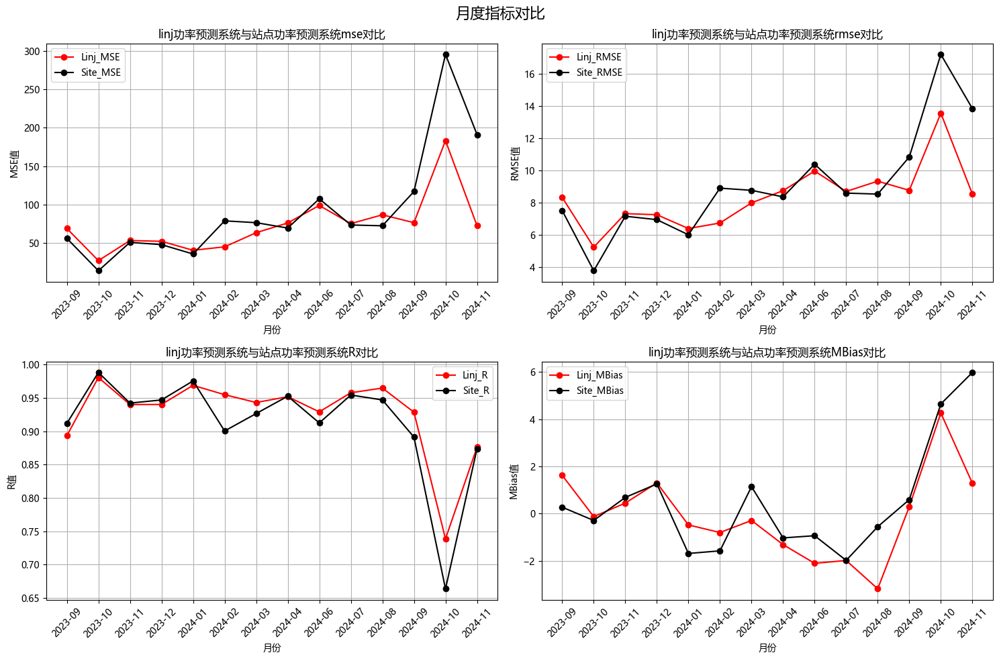

In [62]:
file_path = r'E:\Power_Pre_Model\site_linj_compare_yr.csv'

# 读取数据（假设数据分隔符为空格）
total_df = pd.read_csv(
    file_path,
    header=0,
    low_memory=False,
)

# 创建子图
fig, axes = plt.subplots(2, 2, figsize=(15, 10))
fig.suptitle('月度指标对比', fontsize=16)

# 绘制第一个子图 - mse对比
axes[0,0].plot(total_df['Month'], total_df['Linj_MSE'], marker='o',label='Linj_MSE',color='red')
axes[0,0].plot(total_df['Month'], total_df['Site_MSE'], marker='o',label='Site_MSE',color='black')
axes[0,0].set_title('linj功率预测系统与站点功率预测系统mse对比')
axes[0,0].set_xlabel('月份')
axes[0,0].set_ylabel('MSE值')
axes[0,0].legend()
plt.setp(axes[0,0].get_xticklabels(), rotation=45)

axes[0,0].grid(True)

# 绘制第二个子图 - RMSE对比
axes[0,1].plot(total_df['Month'], total_df['Linj_RMSE'], marker='o',label='Linj_RMSE',color='red')
axes[0,1].plot(total_df['Month'], total_df['Site_RMSE'], marker='o',label='Site_RMSE',color='black')
axes[0,1].set_title('linj功率预测系统与站点功率预测系统rmse对比')
axes[0,1].set_xlabel('月份')
axes[0,1].set_ylabel('RMSE值')
axes[0,1].legend()
plt.setp(axes[0,1].get_xticklabels(), rotation=45)
axes[0,1].grid(True)

# 绘制第三个子图 - R对比
axes[1,0].plot(total_df['Month'], total_df['Linj_R'], marker='o',label='Linj_R',color='red')
axes[1,0].plot(total_df['Month'], total_df['Site_R'], marker='o',label='Site_R',color='black')
axes[1,0].set_title('linj功率预测系统与站点功率预测系统R对比')
axes[1,0].set_xlabel('月份')
axes[1,0].set_ylabel('R值')
axes[1,0].legend()
plt.setp(axes[1,0].get_xticklabels(), rotation=45)
axes[1,0].grid(True)

# 绘制第四个子图 - 预测PR
axes[1,1].plot(total_df['Month'], total_df['Linj_MBias'], marker='o',label='Linj_MBias',color='red')
axes[1,1].plot(total_df['Month'], total_df['Site_MBias'], marker='o',label='Site_MBias',color='black')
axes[1,1].set_title('linj功率预测系统与站点功率预测系统MBias对比')
axes[1,1].set_xlabel('月份')
axes[1,1].set_ylabel('MBias值')
axes[1,1].legend()
plt.setp(axes[1,1].get_xticklabels(), rotation=45)
axes[1,1].grid(True)

# 调整子图布局
plt.tight_layout()

save_dir = 'month_compare_yr'
os.makedirs(save_dir, exist_ok=True)  # 创建保存目录，若不存在则创建
plt.savefig(os.path.join(save_dir, f"month_compare_yr.png"), dpi=500, format='png', bbox_inches='tight', pad_inches=0)
plt.show()
